# Phenology_vids
### Purpose: Create time lapse videos of a region for any location
### Steps:
1. Link to DataCube
2. Specify time frame, central location, buffer size
3. Download Sentinel data
4. Generate indices as needed. 
5. Resample weekly???
6. run xr_animation and save plots
    - option to load polygon data (e.g. cadastrals)???
    - if loading cadastrals, show trace plots of indices within polygons???import matplotlib.pyplot as plt




In [1]:
%matplotlib inline

import os
import datacube
import numpy as np
import pandas as pd
import xarray as xr
import datetime as dt
import matplotlib.pyplot as plt

import sys
sys.path.insert(1, '../Tools/')
from dea_tools.temporal import xr_phenology, temporal_statistics
from dea_tools.datahandling import load_ard
from dea_tools.bandindices import calculate_indices
from dea_tools.plotting import display_map, rgb
from dea_tools.dask import create_local_dask_cluster

from dea_tools.plotting import display_map, rgb, xr_animation
import skimage

# Plot animation
from IPython.display import Image
from IPython.core.display import Video


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Create local dask cluster to improve data load time
client = create_local_dask_cluster(return_client=True)

/g/data/v10/public/modules/dea/20231204/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 37095 instead
  warnings.warn(
2024-04-29 14:35:47,574 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 131415613952 due to system memory limit of 32.00 GiB


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/37095/status,
Dashboard: /proxy/37095/status,Workers: 1
Total threads: 7,Total memory: 32.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38069,Workers: 1
Dashboard: /proxy/37095/status,Total threads: 7
Started: Just now,Total memory: 32.00 GiB
Comm: tcp://127.0.0.1:38621,Total threads: 7
Dashboard: /proxy/40919/status,Memory: 32.00 GiB
Nanny: tcp://127.0.0.1:35363,


In [2]:
dc = datacube.Datacube(app='Vegetation_phenology')

In [3]:
# Define area of interest

# # 186 Milgadara Rd, Barwang NSW: -34.38904277303204, 148.46949938279096
# Yelkin -33.47904684379098, 146.3094839864518
# Boomahnoomoona -36.11965805095775, 146.08472404116773
# Adam O'tool site: -33.5040228817206, 148.6385170105664
# Grant Sims multispecies cover crop experiment sites -36.22746736927963, 144.40088864017818
# Spring Valley farm: -35.284243390317, 149.0074353022316

stub = 'ADAMO'
stub = "SPRVAL"

lat = -35.284243390317
lon = 149.0074353022316
lon_buffer = 0.01
lat_buffer = 0.01

# Set the range of dates for the analysis
time_range = ('2023-01-01', '2024-04-01') # when is the earliest? 2016?

# Combine central lat,lon with buffer to get area of interest
lat_range = (lat-lat_buffer, lat+lat_buffer)
lon_range = (lon-lon_buffer, lon+lon_buffer)

display_map(x=lon_range, y=lat_range)


In [4]:
# Create a reusable query
query = {
    'y': lat_range,
    'x': lon_range,
    'time': time_range,
    'measurements': ['nbart_red', 'nbart_green', 'nbart_blue', 'nbart_nir_1'],
    'resolution': (-20, 20),
    'output_crs': 'epsg:6933',
    'group_by':'solar_day'
}

# Load available data from Sentinel-2
ds = load_ard(
    dc=dc,
    products=['ga_s2am_ard_3', 'ga_s2bm_ard_3'],
    cloud_mask='s2cloudless',
    min_gooddata=0.9,
    **query,
)

# Shut down Dask client now that we have loaded the data we need
client.close()

# Preview data
ds


Finding datasets
    ga_s2am_ard_3
    ga_s2bm_ard_3
Counting good quality pixels for each time step using s2cloudless


/g/data/v10/public/modules/dea/20231204/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/g/data/v10/public/modules/dea/20231204/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


Filtering to 33 out of 89 time steps with at least 90.0% good quality pixels
Applying s2cloudless pixel quality/cloud mask
Loading 33 time steps


<xarray.Dataset>
Dimensions:      (time: 33, y: 106, x: 97)
Coordinates:
  * time         (time) datetime64[ns] 2023-01-09T00:06:28.779134 ... 2024-03...
  * y            (y) float64 -4.227e+06 -4.227e+06 ... -4.229e+06 -4.23e+06
  * x            (x) float64 1.438e+07 1.438e+07 ... 1.438e+07 1.438e+07
    spatial_ref  int32 6933
Data variables:
    nbart_red    (time, y, x) float32 616.0 706.0 939.0 ... 597.0 622.0 731.0
    nbart_green  (time, y, x) float32 496.0 627.0 745.0 ... 535.0 542.0 631.0
    nbart_blue   (time, y, x) float32 340.0 413.0 457.0 ... 401.0 414.0 459.0
    nbart_nir_1  (time, y, x) float32 2.303e+03 2.616e+03 ... 1.838e+03 2e+03
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref

In [5]:
# Calculate the chosen vegetation proxy index and add it to the loaded data set
ds = calculate_indices(ds, index=['NDVI','NDWI'], collection='ga_s2_3')

In [6]:
ds_weekly = ds.resample(time="1W").interpolate("linear")

In [7]:
path_animations = '/home/jovyan/Projects/PaddockTS/Results/'
num_frames = 20
num_frames = len(ds_weekly.time) # get total length from ds_weekly


In [10]:
num_frames

64

Exporting animation to /home/jovyan/Projects/PaddockTS/Results/SPRVAL_NDVI_weekly_nomarkup.mp4


  0%|          | 0/64 (0.0 seconds remaining at ? frames/s)

FileNotFoundError: [Errno 2] No such file or directory: '/home/jovyan'

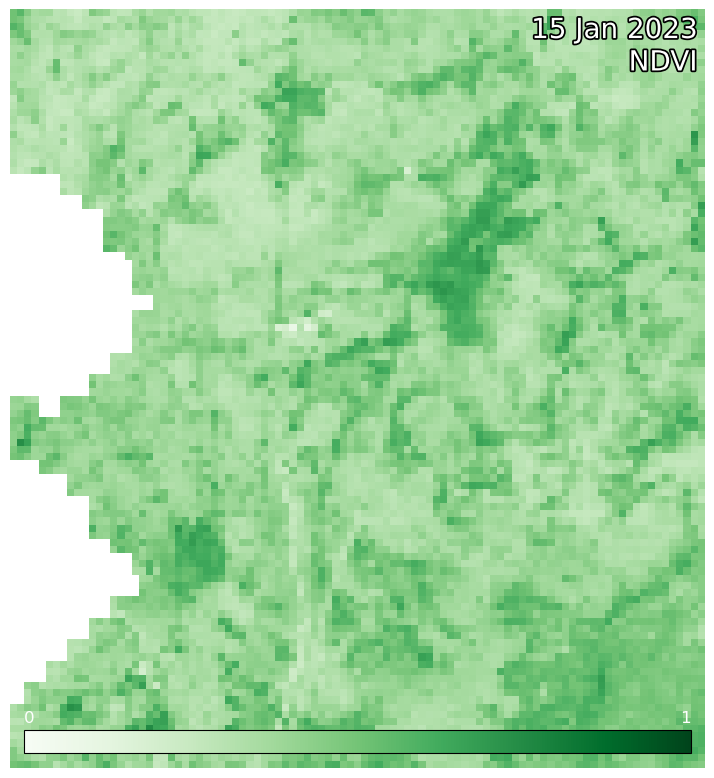

In [11]:
# Create animation of weekly resampled NDVI
output = path_animations+stub+'_NDVI_weekly_nomarkup.mp4'

ds_ = ds_weekly.interpolate_na(dim = 'time', method = 'linear')

xr_animation(ds_, 
             bands=['NDVI'], 
             output_path = output, 
             #show_gdf = gdf_, 
             #gdf_kwargs={"edgecolor": 'blue'},
             #gdf_kwargs={"edgecolor": pol['color_edge']}, # Make edge color something different
             show_text="NDVI",
             imshow_kwargs={"cmap": "Greens", "vmin": 0.0, "vmax": 1.0},
             limit=num_frames)

plt.close()
Video(output, embed=True)

In [23]:
# Create animation of weekly resampled NDVI

output = path_animations+stub+'_NDVI_nomarkup.mp4'


ds_ = ds.interpolate_na(dim = 'time', method = 'linear')

xr_animation(ds_, 
             bands=['NDVI'], 
             #bands=['nbart_red', 'nbart_green', 'nbart_blue'], 
             output_path = output, 
             show_text="NDVI",
             imshow_kwargs={"cmap": "Greens", "vmin": 0.0, "vmax": 1.0},
             limit=num_frames)

plt.close()
Video(output, embed=True)


Exporting animation to /home/jovyan/Projects/PaddockTS/Results/SPRVAL_NDVI_nomarkup.mp4


  0%|          | 0/216 (0.0 seconds remaining at ? frames/s)

In [24]:
# RGB actual time series

output = path_animations+stub+'_RGB_nomarkup.mp4'

ds_ = ds.interpolate_na(dim = 'time', method = 'linear')

xr_animation(ds_, 
             bands=['nbart_red', 'nbart_green', 'nbart_blue'], 
             output_path = output, 
             limit=num_frames)

plt.close()
Video(output, embed=True)

Exporting animation to /home/jovyan/Projects/PaddockTS/Results/SPRVAL_RGB_nomarkup.mp4


  0%|          | 0/216 (0.0 seconds remaining at ? frames/s)

In [25]:
# RGB weekly resampled time series

output = path_animations+stub+'_RGB_weekly_nomarkup.mp4'

ds_ = ds_weekly.interpolate_na(dim = 'time', method = 'linear')

xr_animation(ds_, 
             bands=['nbart_red', 'nbart_green', 'nbart_blue'], 
             output_path = output, 
             limit=num_frames)

plt.close()
Video(output, embed=True)

Exporting animation to /home/jovyan/Projects/PaddockTS/Results/SPRVAL_RGB_weekly_nomarkup.mp4


  0%|          | 0/378 (0.0 seconds remaining at ? frames/s)

In [13]:
ds_weekly

<xarray.Dataset>
Dimensions:      (time: 368, y: 322, x: 290)
Coordinates:
  * y            (y) float64 -4.037e+06 -4.037e+06 ... -4.043e+06 -4.043e+06
  * x            (x) float64 1.434e+07 1.434e+07 ... 1.434e+07 1.434e+07
    spatial_ref  int32 6933
  * time         (time) datetime64[ns] 2017-03-12 2017-03-19 ... 2024-03-24
Data variables:
    nbart_red    (time, y, x) float64 2.1e+03 2.06e+03 1.997e+03 ... nan nan nan
    nbart_green  (time, y, x) float64 1.43e+03 1.393e+03 1.323e+03 ... nan nan
    nbart_blue   (time, y, x) float64 1.034e+03 973.2 939.5 ... nan nan nan
    nbart_nir_1  (time, y, x) float64 3.251e+03 3.23e+03 3.18e+03 ... nan nan
    NDVI         (time, y, x) float64 0.2195 0.2235 0.2322 ... nan nan nan
    NDWI         (time, y, x) float64 -0.3911 -0.3983 -0.4132 ... nan nan nan
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref